In [4]:
import pandas as pd
# Notebook to test the animation of the plot
# go to the root of the project
# we are using autoreload extension, in charge to reload all the imported package/modules
# without the need to restart the kernel

%load_ext autoreload
%autoreload 2
%matplotlib inline


def set_paths() -> None:
    """
    set correct working directory and python path when started from within PyCharm
    """

    import sys
    import os

    # only change the directory if we have not yet done so
    if "cwd" not in globals():
        # noinspection PyGlobalUndefined
        global cwd
        cwd = os.getcwd()
        os.chdir(cwd)
        # append the source directory
        sys.path.append("../src/")

    print(f"working dir is '{os.getcwd()}'")

set_paths()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
working dir is '/Users/benkiranekamil/Desktop/Projects/Mindfuel/Self Driving Cars/bcg-NN-genetic-cars/notebooks'


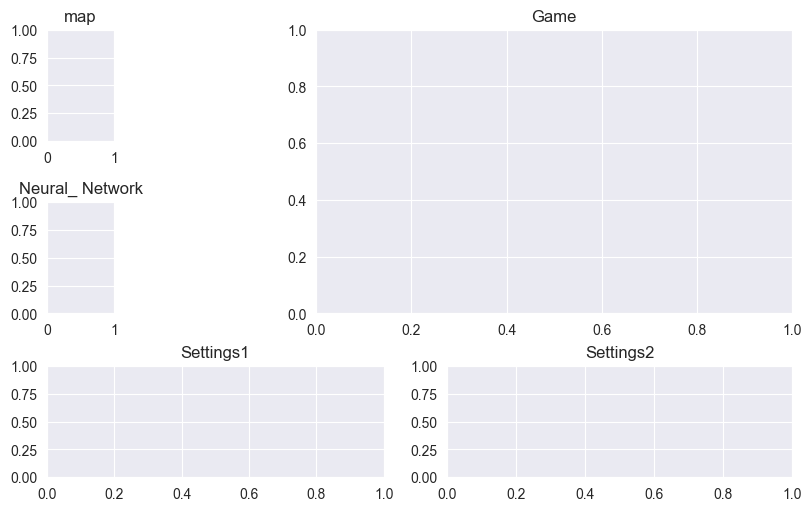

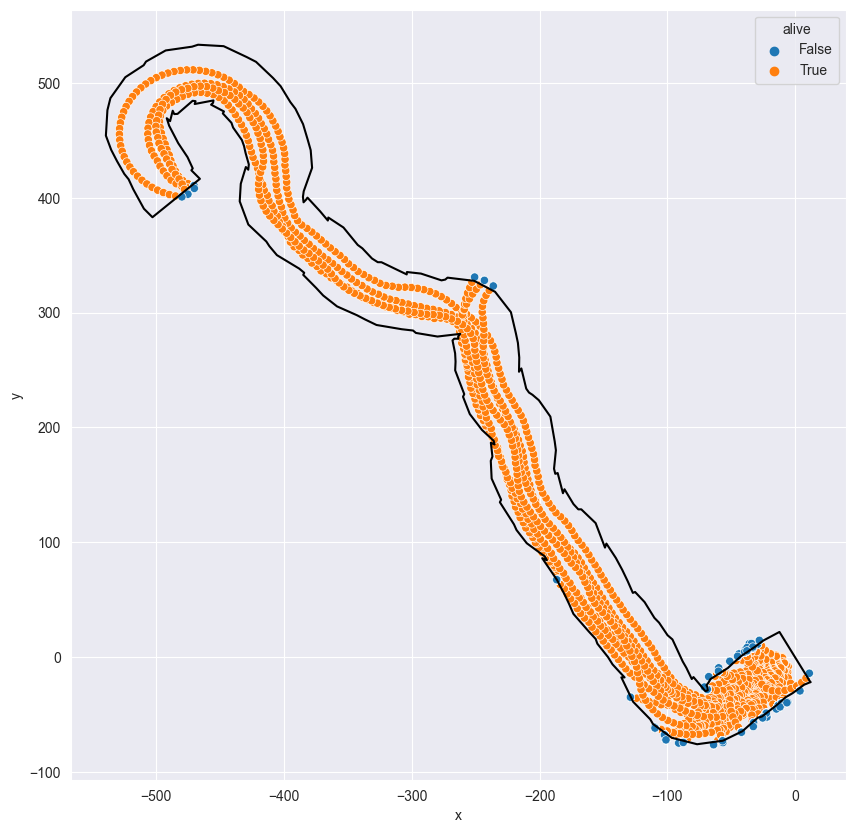

 --- Generation 0 :  159.7677132407942
Number of surviving cars: 0
Number of Timesteps before all cars are out or T_max is reached: 193
max fitness = 990.0


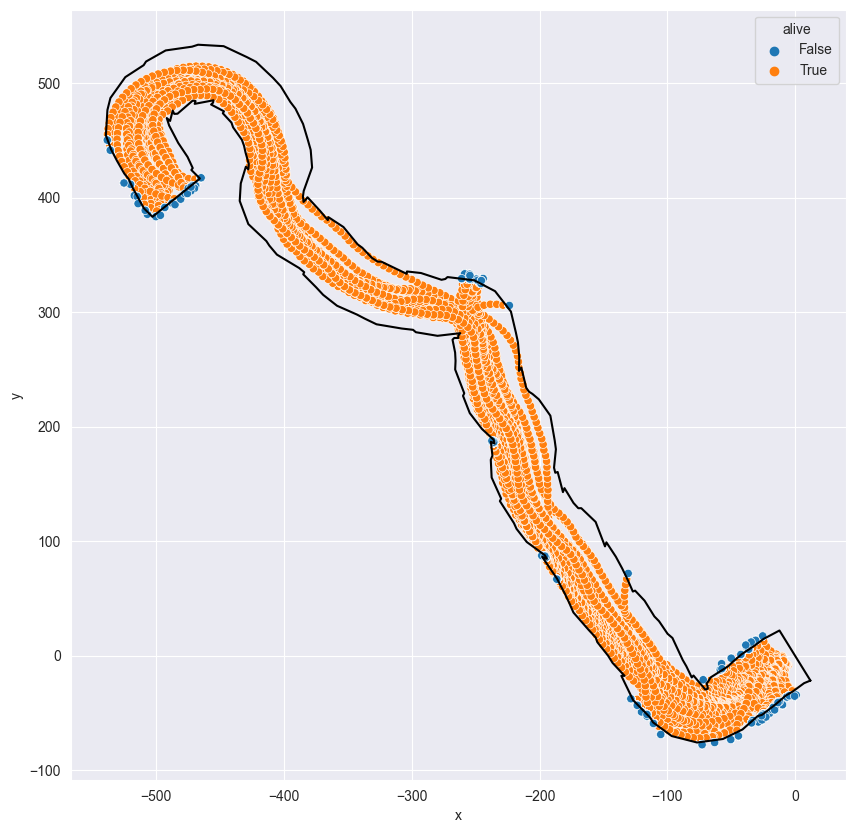

 --- Generation 1 :  425.2781213776872
Number of surviving cars: 0
Number of Timesteps before all cars are out or T_max is reached: 195
max fitness = 990.0


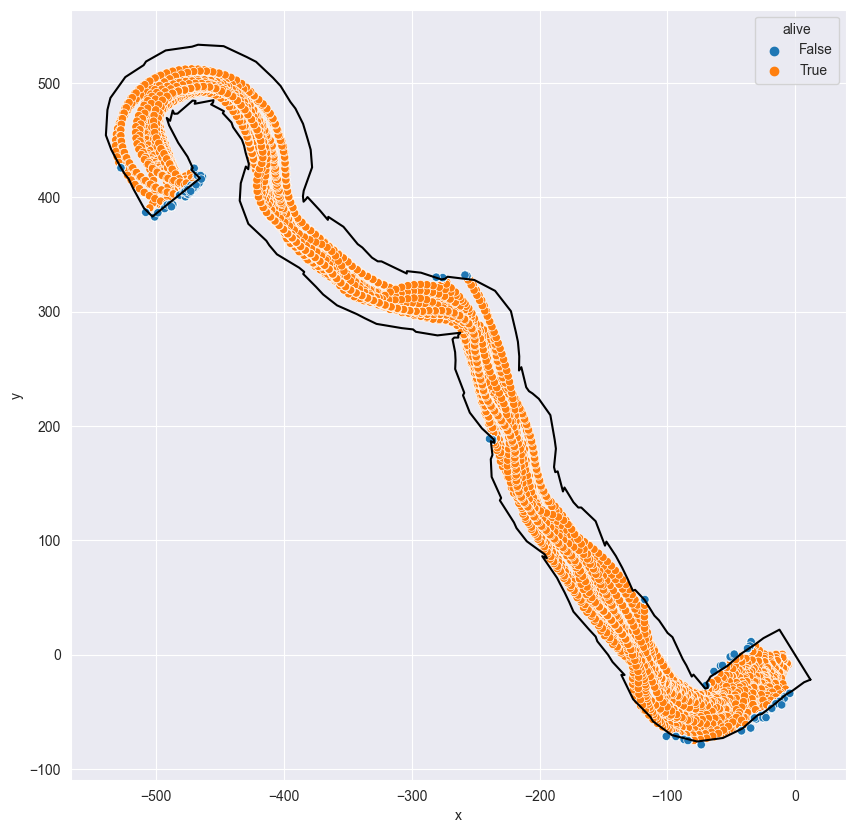

In [14]:
from driving.utils import get_dataframe_from_positions
from driving.environment import Environment
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
T_max = 400
env = Environment(nb_cars=50, n_points=100, width=50)
dict_pos = {}
G = 0
for car in env.cars:
    car.move_car(np.random.rand() * 2 - 1)
dict_pos[G] = env.NN_sim_until_out_noplot_norprint(T_max = T_max)
df = get_dataframe_from_positions(dict_pos)
fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(*env.route.polygon.exterior.xy, color='black')
sns.scatterplot(data=df[df["Generation"]==G],
                x="x", y="y", hue="alive", ax=ax)
plt.show()
nb_gen = 2


for idx_gen in range(nb_gen):
    max_car = {"idx": 0, "fitness": 0}
    for i, car in enumerate(env.cars):
        car_fit = {"idx": i, "fitness": car.fitness(env.route)}
        if car_fit["fitness"] > max_car["fitness"]:
            max_car = car_fit
    # env.cars[max_car["idx"]].plot_pos()
    # plt.plot(*env.route.polygon.exterior.xy)
    # plt.axis("equal")
    # plt.show()
    print(" --- Generation {} : ".format(idx_gen), np.mean(env.fitnesses()))
    nb_surviving_cars = np.sum([car["alive"] for i, car in dict_pos[G][max(dict_pos[G].keys())].items()])
    print(f"Number of surviving cars: {nb_surviving_cars}")
    print(f"Number of Timesteps before all cars are out or T_max is reached: {max(dict_pos[G].keys())}")
    print('max fitness = {}'.format(max(env.fitnesses())))

    G+=1
    env.make_new_gen(10, nb_mut=1)
    for car in env.cars:
        car.move_car(np.random.rand() * 2 - 1)
    dict_pos[G] = env.NN_sim_until_out_noplot_norprint(T_max= T_max)
    df = get_dataframe_from_positions(dict_pos)
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.plot(*env.route.polygon.exterior.xy, color='black')
    sns.scatterplot(data=df[df["Generation"]==G],
                    x="x", y="y", hue="alive", ax=ax)
    plt.show()


In [ ]:

for idx_gen in range(nb_gen):
    max_car = {"idx": 0, "fitness": 0}
    for i, car in enumerate(env.cars):
        car_fit = {"idx": i, "fitness": car.fitness(env.route)}
        if car_fit["fitness"] > max_car["fitness"]:
            max_car = car_fit
    # env.cars[max_car["idx"]].plot_pos()
    # plt.plot(*env.route.polygon.exterior.xy)
    # plt.axis("equal")
    # plt.show()
    print(" --- Generation {} : ".format(idx_gen), np.mean(env.fitnesses()))
    nb_surviving_cars = np.sum([car["alive"] for i, car in dict_pos[G][max(dict_pos[G].keys())].items()])
    print(f"Number of surviving cars: {nb_surviving_cars}")
    print(f"Number of Timesteps before all cars are out or T_max is reached: {max(dict_pos[G].keys())}")
    print('max fitness = {}'.format(max(env.fitnesses())))

    G+=1
    env.make_new_gen(10, nb_mut=1)
    for car in env.cars:
        car.move_car(np.random.rand() * 2 - 1)
    dict_pos[G] = env.NN_sim_until_out_noplot_norprint(T_max= T_max)
    df = get_dataframe_from_positions(dict_pos)
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.plot(*env.route.polygon.exterior.xy, color='black')
    sns.scatterplot(data=df[df["Generation"]==G],
                    x="x", y="y", hue="alive", ax=ax)
    plt.show()


 --- Generation 0 :  845.3550443835437
Number of surviving cars: 25
Number of Timesteps before all cars are out or T_max is reached: 400
max fitness = 1972.9231389497402


AttributeError: module 'PIL' has no attribute 'Image'

<Figure size 1000x1000 with 1 Axes>

 --- Generation 1 :  630.0990325637691
Number of surviving cars: 20
Number of Timesteps before all cars are out or T_max is reached: 400
max fitness = 1985.2260791927756


AttributeError: module 'PIL' has no attribute 'Image'

<Figure size 1000x1000 with 1 Axes>

 --- Generation 2 :  772.357923450017
Number of surviving cars: 25
Number of Timesteps before all cars are out or T_max is reached: 400
max fitness = 1982.9595808210015


AttributeError: module 'PIL' has no attribute 'Image'

<Figure size 1000x1000 with 1 Axes>

 --- Generation 3 :  643.4844329175169
Number of surviving cars: 20
Number of Timesteps before all cars are out or T_max is reached: 400
max fitness = 1976.8987312922438


In [27]:
import copy
env2 = Environment(nb_cars=100)
env2.cars = copy.deepcopy(env.cars)

# Initialize cars position
for car in env2.cars:
    car.pos = (0,0)
    car.move_car(np.random.rand() * 2 - 1)
    car.theta = env2.route.initial_theta
G2=0
dict_pos_new_route = {}
dict_pos_new_route[G2] = env2.NN_sim_until_out_noplot_norprint()
df2 = get_dataframe_from_positions(dict_pos_new_route)
fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(*env2.route.polygon.exterior.xy, color='black')
sns.scatterplot(data=df2[df2["Generation"]==G2],
                x="x", y="y", hue="alive", ax=ax)
plt.show()

AttributeError: module 'PIL' has no attribute 'Image'

<Figure size 800x500 with 5 Axes>

AttributeError: module 'PIL' has no attribute 'Image'

<Figure size 1000x1000 with 1 Axes>

<AxesSubplot:xlabel='x', ylabel='y'>

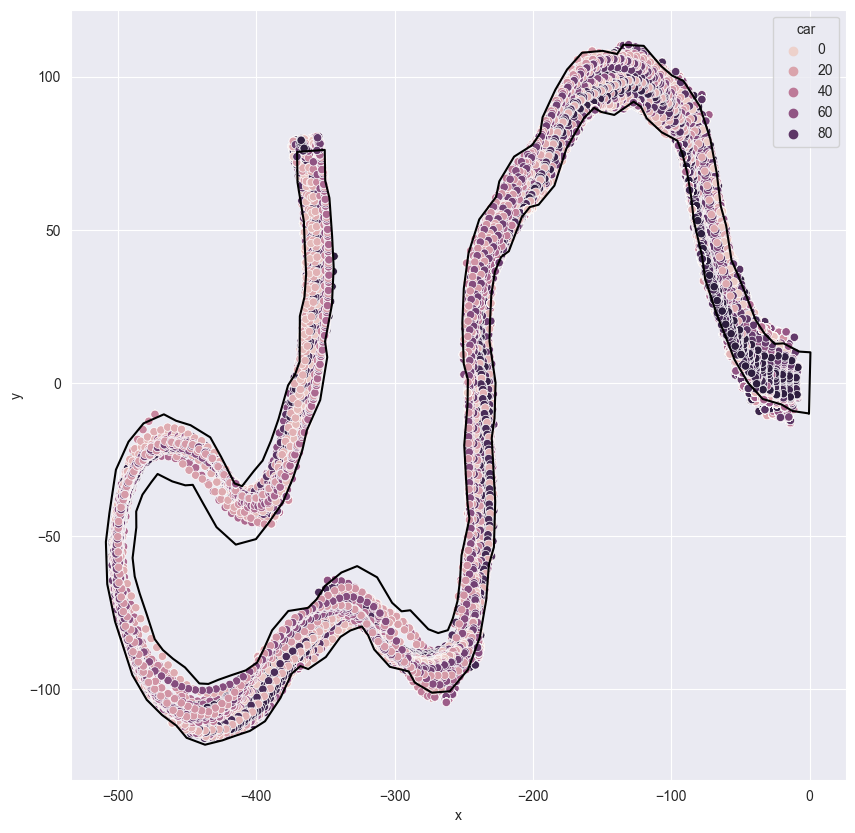

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(*env.route.polygon.exterior.xy, color='black')
sns.scatterplot(data=df, x="x", y="y", hue="car", ax=ax)

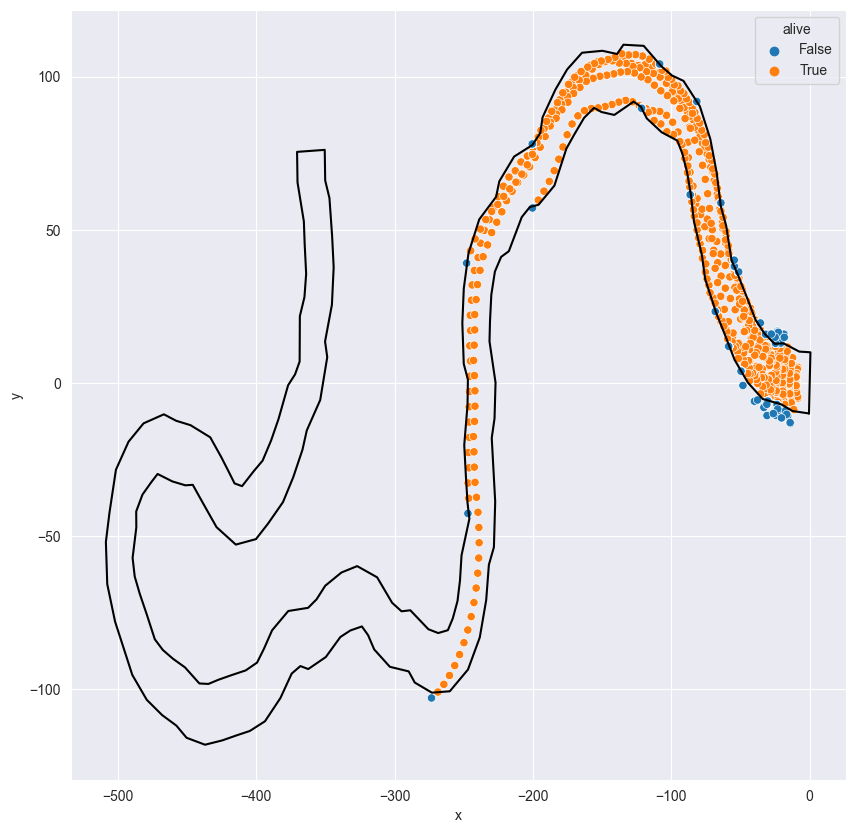

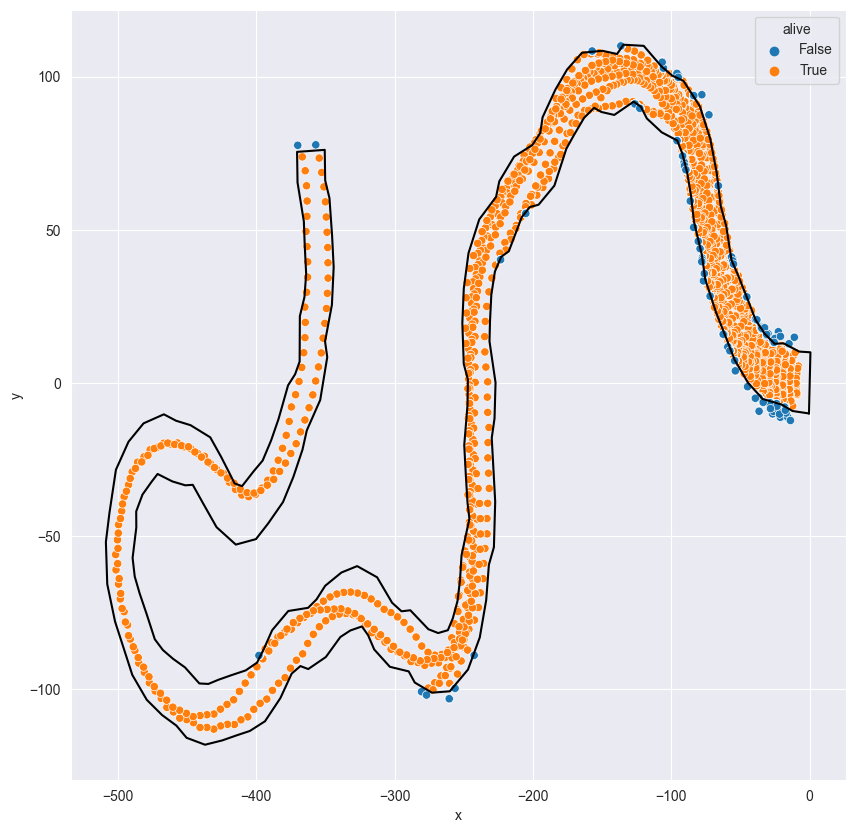

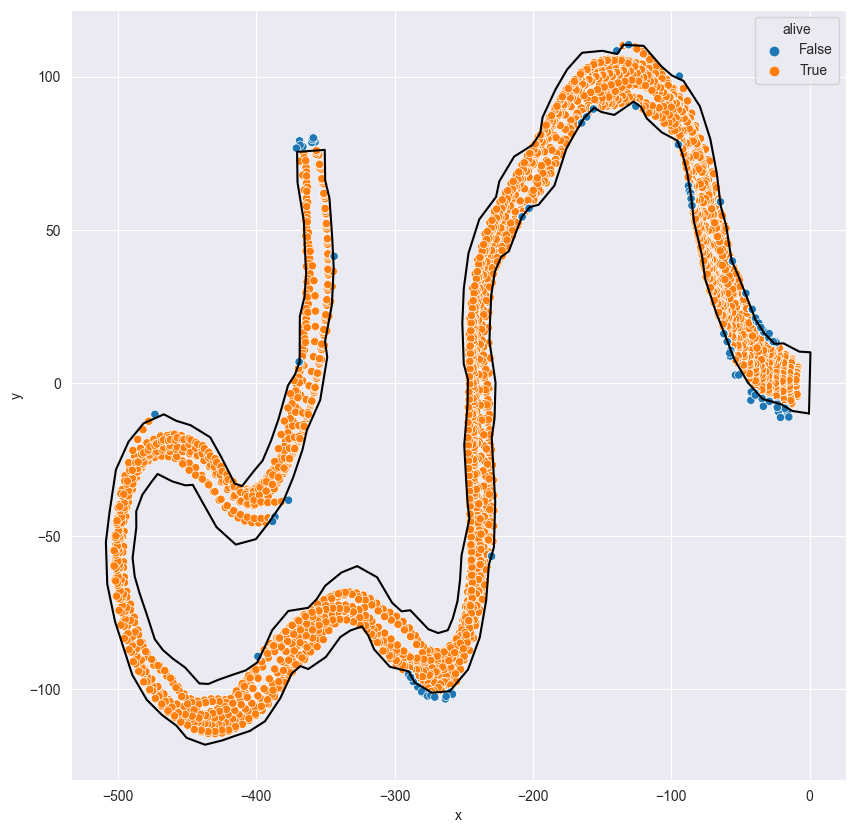

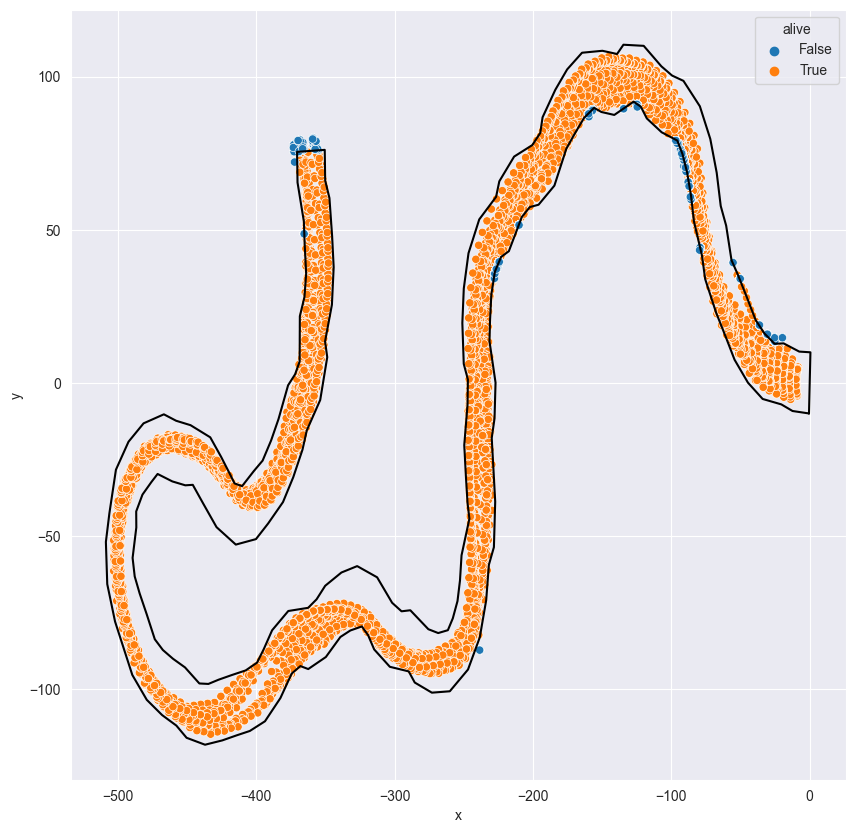

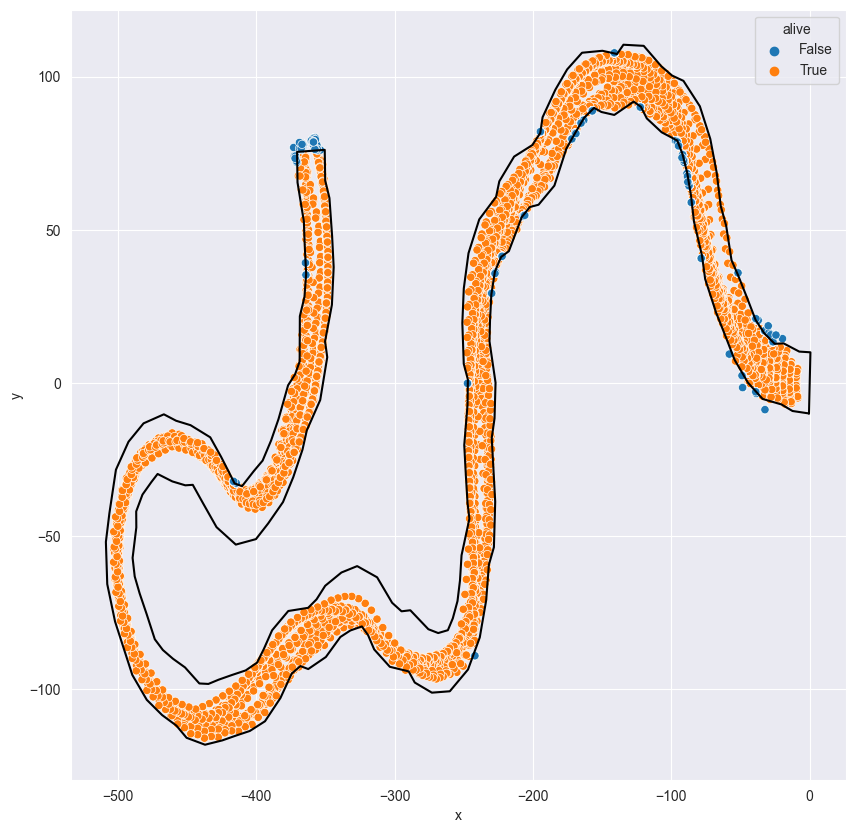

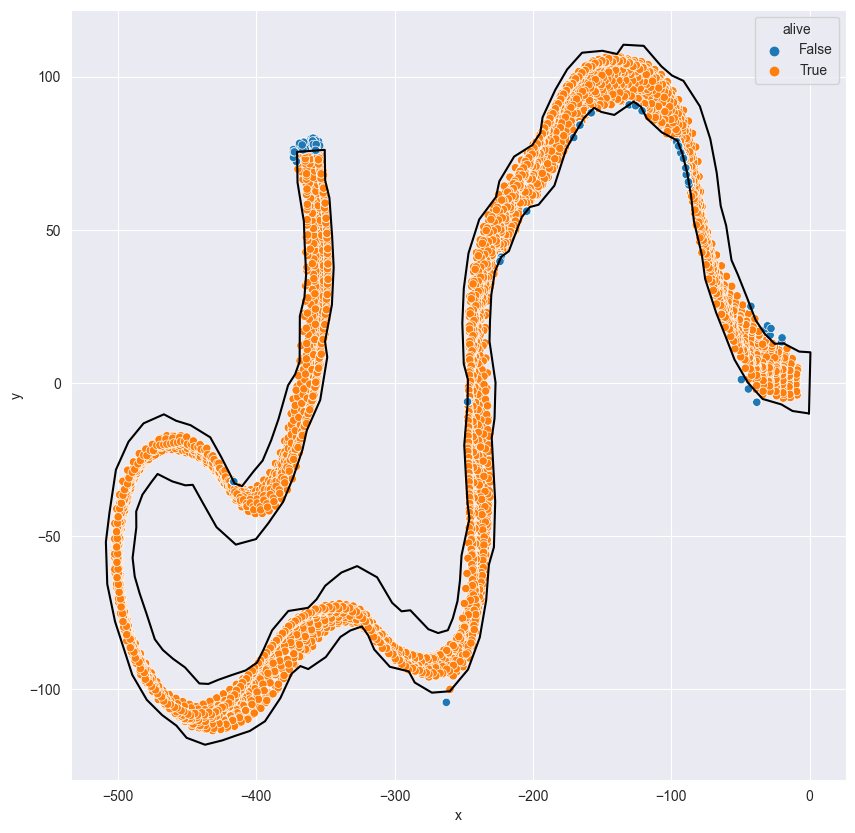

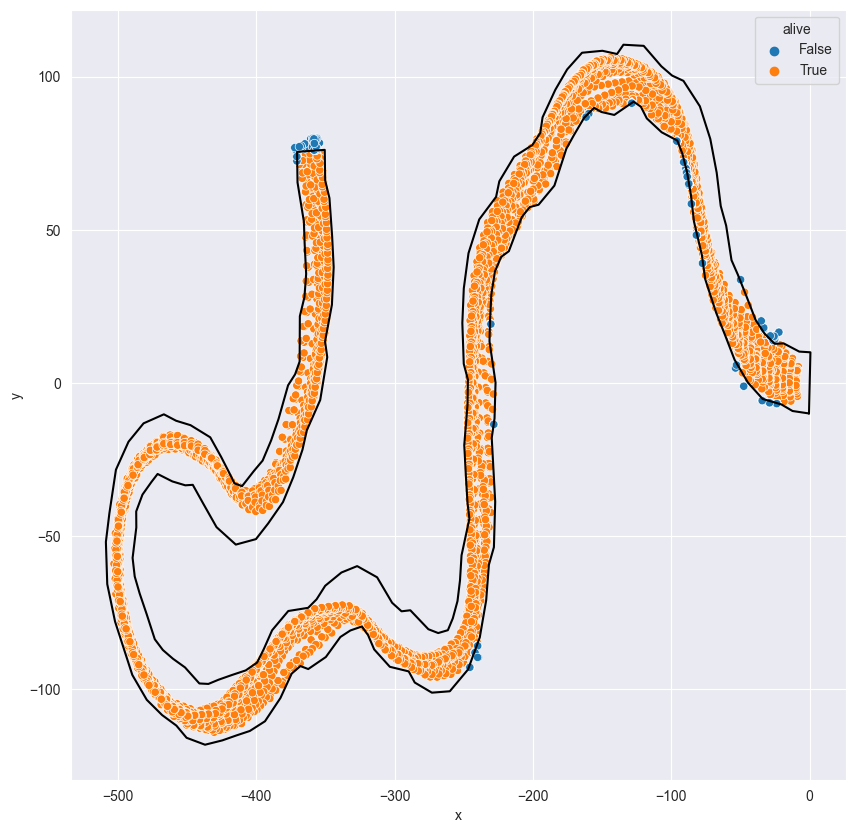

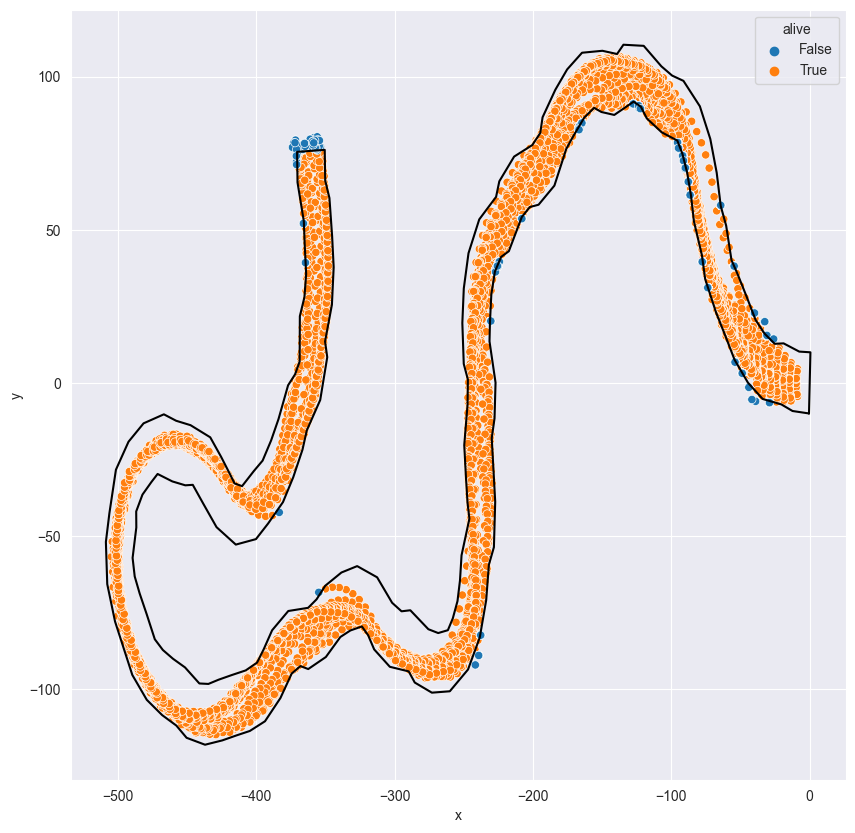

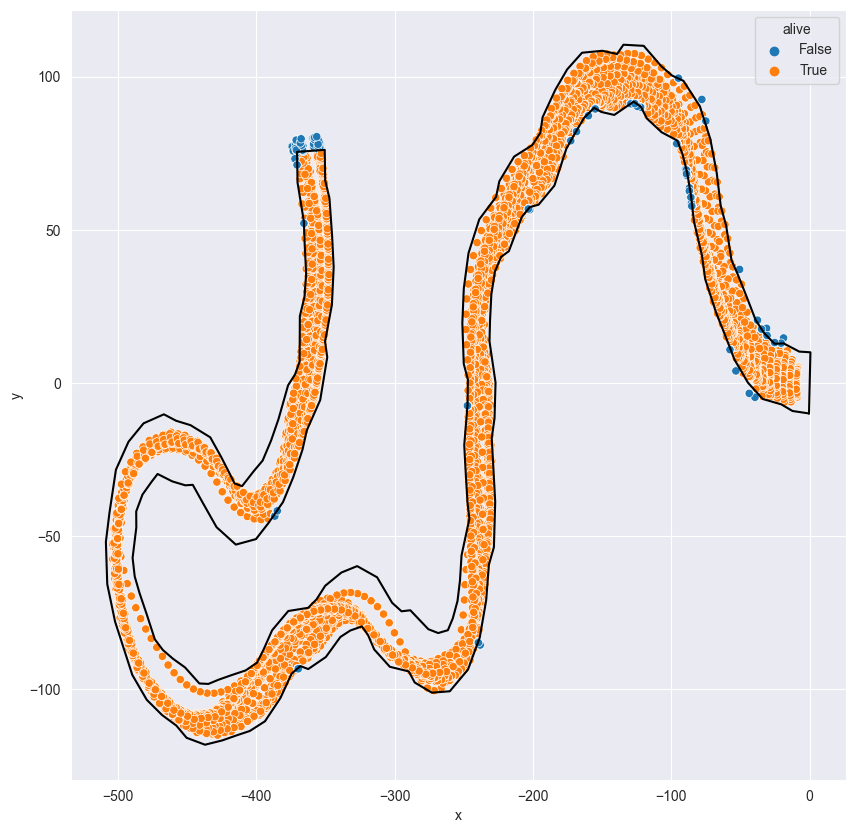

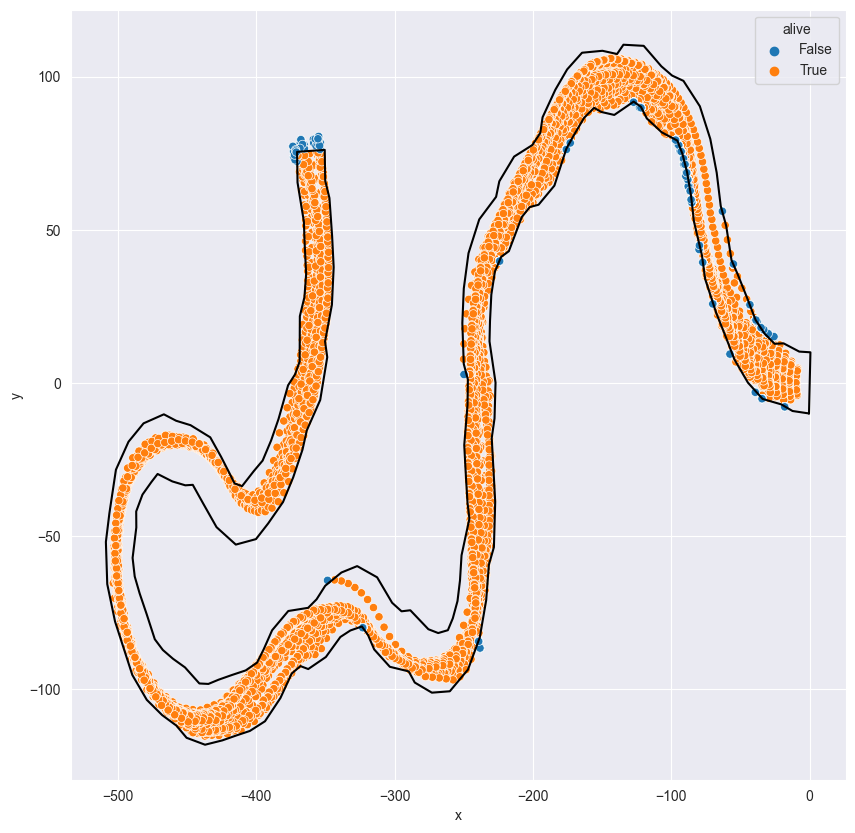

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
for g in range( 10):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.plot(*env.route.polygon.exterior.xy, color='black')
    sns.scatterplot(data=df[df["Generation"]==g],
                    x="x", y="y", hue="alive", ax=ax)


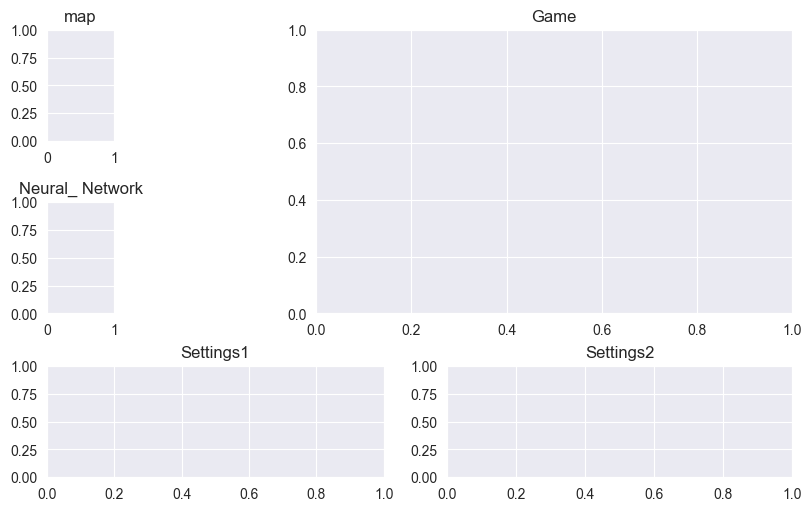

In [17]:
env2 = Environment(nb_cars=100)

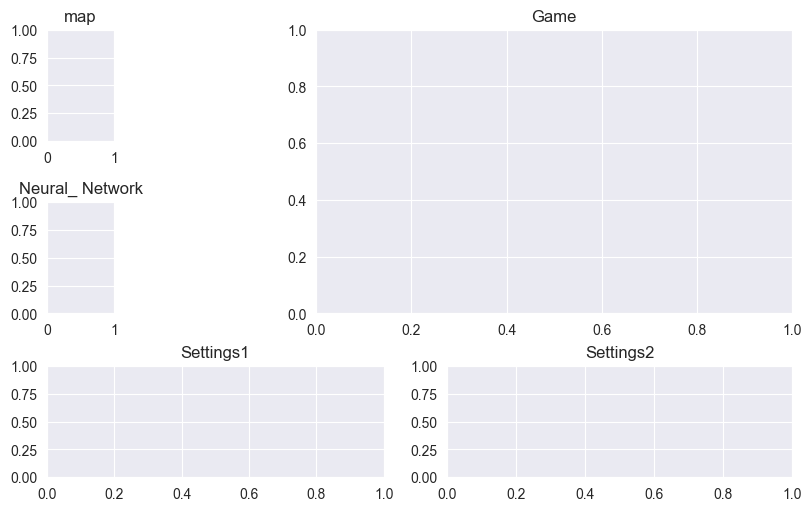

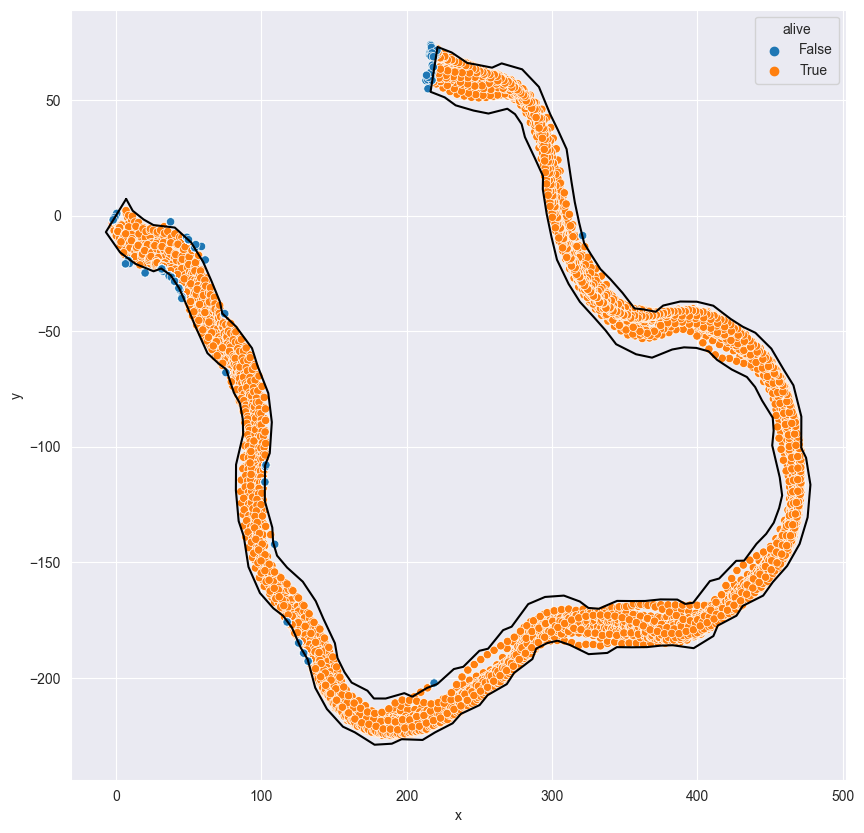

In [10]:
import copy
env2 = Environment(nb_cars=100)
env2.cars = copy.deepcopy(env.cars)

# Initialize cars position
for car in env2.cars:
    car.pos = (0,0)
    car.move_car(np.random.rand() * 2 - 1)
    car.theta = env2.route.initial_theta
G2=0
dict_pos_new_route = {}
dict_pos_new_route[G2] = env2.NN_sim_until_out_noplot_norprint()
df2 = get_dataframe_from_positions(dict_pos_new_route)
fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(*env2.route.polygon.exterior.xy, color='black')
sns.scatterplot(data=df2[df2["Generation"]==G2],
                x="x", y="y", hue="alive", ax=ax)
plt.show()

In [27]:
columns = ["Generation", "T", "car", "x", "y", "alive"]
dict_pos_df_2 = {
    "Generation": [],
    "T": [],
    "car": [],
    "x": [],
    "y": [],
    "alive": []
}

for gen in dict_pos_new_route.keys():
    for T in dict_pos_new_route[gen].keys():
        for car in dict_pos_new_route[gen][T].keys():
            dict_pos_df_2["Generation"].append(gen)
            dict_pos_df_2["T"].append(T)
            dict_pos_df_2["car"].append(car)
            x, y = dict_pos_new_route[gen][T][car]['position']
            dict_pos_df_2["x"].append(x[0] if type(x) == np.ndarray else x)
            dict_pos_df_2["y"].append(y[0] if type(y) == np.ndarray else y)
            dict_pos_df_2["alive"].append(dict_pos_new_route[gen][T][car]["alive"])

df2 = pd.DataFrame.from_dict(dict_pos_df_2)

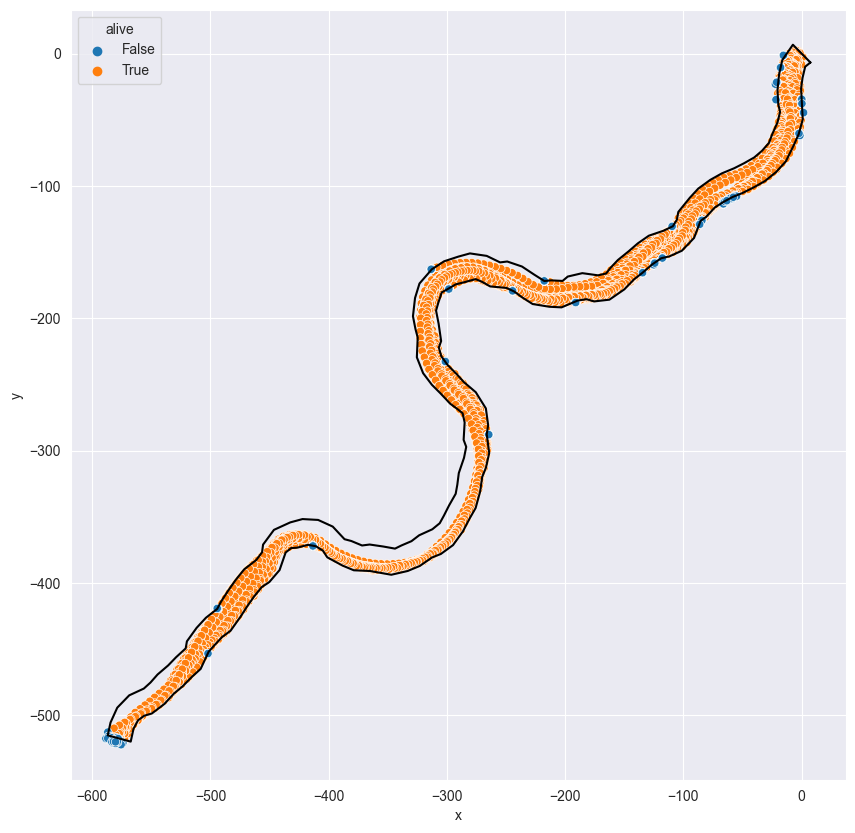

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
for g in range(df2.Generation.max()+1):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.plot(*env2.route.polygon.exterior.xy, color='black')
    sns.scatterplot(data=df2[df2["Generation"]==g],
                    x="x", y="y", hue="alive", ax=ax)


In [37]:
df.to_csv(
    f"../data/positions_10_gens_training_initial_route.csv",
    sep=";",
)

df2.to_csv(
    f"../data/positions_1_gen_testing_new_route.csv",
    sep=";",
)

In [2]:
df = pd.read_csv(
    f"../data/positions_10_gens_training_initial_route.csv",
    sep=";",
)

df2 = pd.read_csv(
    f"../data/positions_1_gen_testing_new_route.csv",
    sep=";",
)

In [3]:
env.UI

NameError: name 'env' is not defined

<AxesSubplot:xlabel='x', ylabel='y'>

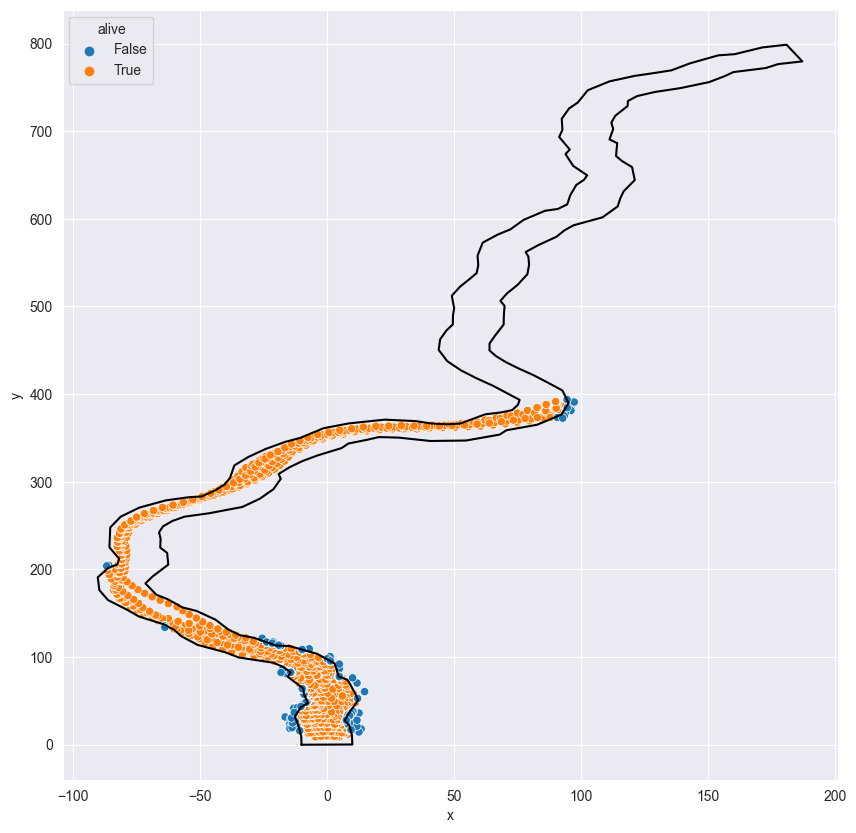

In [8]:
G+=1
env.make_new_gen(10, nb_mut=1)
for car in env.cars:
    car.move_car(np.random.rand() * 2 - 1)
dict_pos[G] = env.NN_sim_until_out_noplot_norprint()

columns = ["Generation", "T", "car", "x", "y", "alive"]
dict_pos_df = {
    "Generation": [],
    "T": [],
    "car": [],
    "x": [],
    "y": [],
    "alive": []
}

for gen in dict_pos.keys():
    for T in dict_pos[gen].keys():
        for car in dict_pos[gen][T].keys():
            dict_pos_df["Generation"].append(gen)
            dict_pos_df["T"].append(T)
            dict_pos_df["car"].append(car)
            x, y = dict_pos[gen][T][car]['position']
            dict_pos_df["x"].append(x[0] if type(x) == np.ndarray else x)
            dict_pos_df["y"].append(y[0] if type(y) == np.ndarray else y)
            dict_pos_df["alive"].append(dict_pos[gen][T][car]["alive"])

df = pd.DataFrame.from_dict(dict_pos_df)

import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(*env.route.polygon.exterior.xy, color='black')
sns.scatterplot(data=df[df["Generation"]==1],
                x="x", y="y", hue="alive", ax=ax)

<AxesSubplot:xlabel='x', ylabel='y'>

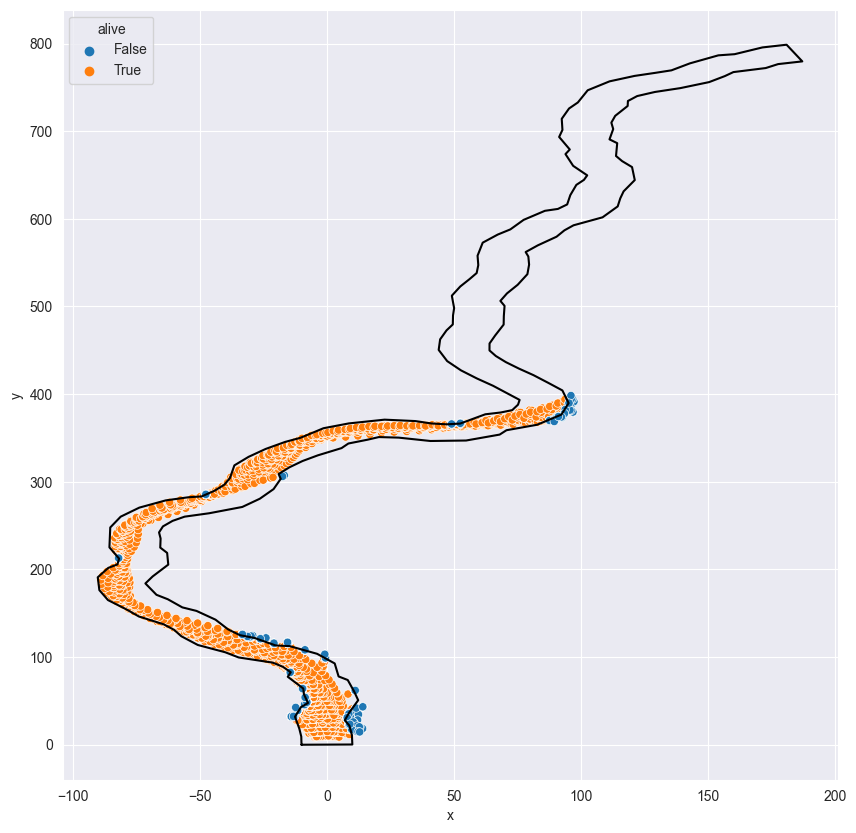

In [9]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(*env.route.polygon.exterior.xy, color='black')
sns.scatterplot(data=df[df["Generation"]==2],
                x="x", y="y", hue="alive", ax=ax)

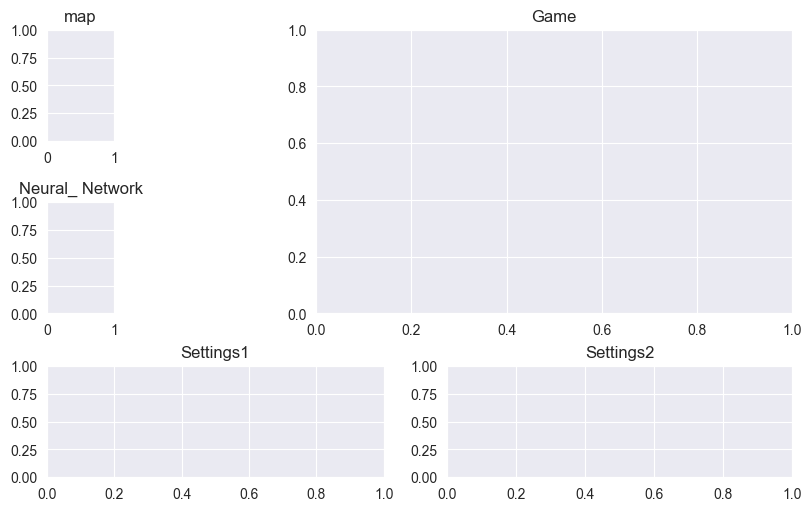

In [2]:
from driving.environment import Environment
import numpy as np

env = Environment(nb_cars=50)

In [3]:
env.cars[35].__dict__

{'pos': (0, 0),
 'theta': 5.284979744102002,
 'point': <shapely.geometry.point.Point at 0x7f9b2a047490>,
 'speed': 5,
 'R': 20,
 'arrow_end': (10.836228035490933, -16.810001843035003),
 'angles_list': [1.5707963267948966,
  0.7853981633974483,
  0,
  -0.7853981633974483,
  -1.5707963267948966],
 'antennas_endpoint': [(168.10001843035005, 108.36228035490933),
  (195.48836621347834, -42.24095968588995),
  (108.36228035490933, -168.10001843035005),
  (-42.24095968588993, -195.48836621347834),
  (-168.10001843035005, -108.36228035490936)],
 'antennas_lines': [<shapely.geometry.linestring.LineString at 0x7f9b2a047550>,
 'model': car_nn(
   (lin1): Linear(in_features=5, out_features=3, bias=True)
   (lin2): Linear(in_features=3, out_features=1, bias=True)
 )}

In [16]:
df[df["Generation"]==1]

,Generation,T,car,x,y,alive
6000,1,0,0,-1.909068,0.519804,True
6001,1,0,1,-1.963217,-0.052942,True
6002,1,0,2,-1.943929,-0.385457,True
6003,1,0,3,-1.899438,0.625071,True
6004,1,0,4,-1.948376,0.329900,True
...,...,...,...,...,...,...
26095,1,200,95,-16.240173,11.523458,False
26096,1,200,96,-23.729105,-7.941305,False
26097,1,200,97,-14.254048,10.946609,False
26098,1,200,98,-13.646667,10.994338,False


In [ ]:
()
for idx_gen in range(nb_gen):
    print(G)
    G += 1
    env.make_new_gen(10, nb_mut=1)
    for car in env.cars:
        car.move_car(np.random.rand() * 2 - 1)
    dict_pos[G] = env.NN_sim_until_out_noplot_norprint()

In [ ]:
pd.DataFrame.from_dict(dict_pos, orient='index')

In [ ]:
columns = ["Generation", "T", "car", "x", "y", "alive"]
dict_pos_df = {
    "Generation": [],
    "T": [],
    "car": [],
    "x": [],
    "y": [],
    "alive": []
}

for gen in dict_pos.keys():
    for T in dict_pos[gen].keys():
        for car in dict_pos[gen][T].keys():
            dict_pos_df["Generation"].append(gen)
            dict_pos_df["T"].append(T)
            dict_pos_df["car"].append(car)
            x, y = dict_pos[gen][T][car]['position']
            dict_pos_df["x"].append(x[0] if type(x) == np.ndarray else x)
            dict_pos_df["y"].append(y[0] if type(y) == np.ndarray else y)
            dict_pos_df["alive"].append(dict_pos[gen][T][car]["alive"])

df = pd.DataFrame.from_dict(dict_pos_df)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(*env.route.polygon.exterior.xy, color='black')
sns.scatterplot(data=df, x="x", y="y", hue="alive", ax=ax)

In [8]:
import plotly.express as px

# Speed up the animation
fig = px.scatter(df[df["Generation"]==0],
                 x="x",
                 y="y",
                 color="alive",
                 hover_name="car",
                animation_frame="T",

                    range_x=[-1000, 200],
                    range_y=[-1000,200],


                 )
fig.update_layout(
    title="Evolution of the cars",
    xaxis_title="x",
    yaxis_title="y",
    legend_title="Alive",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    )
)
fig.show()

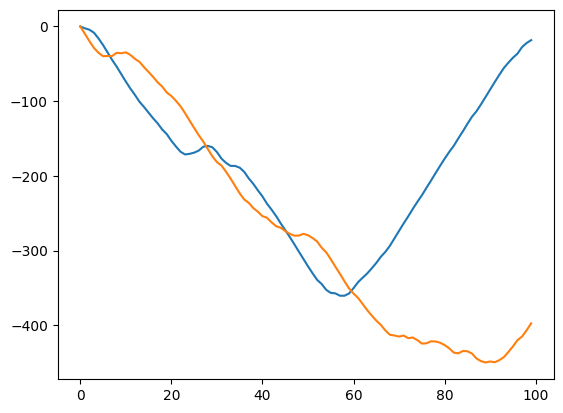

In [57]:
plt.plot(env.route.points)

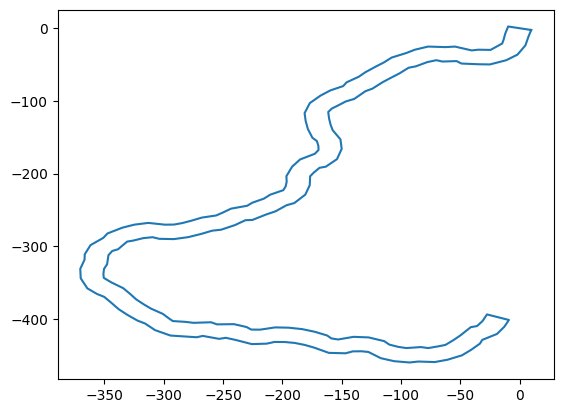

In [63]:
plt.plot(*env.route.polygon.exterior.xy)

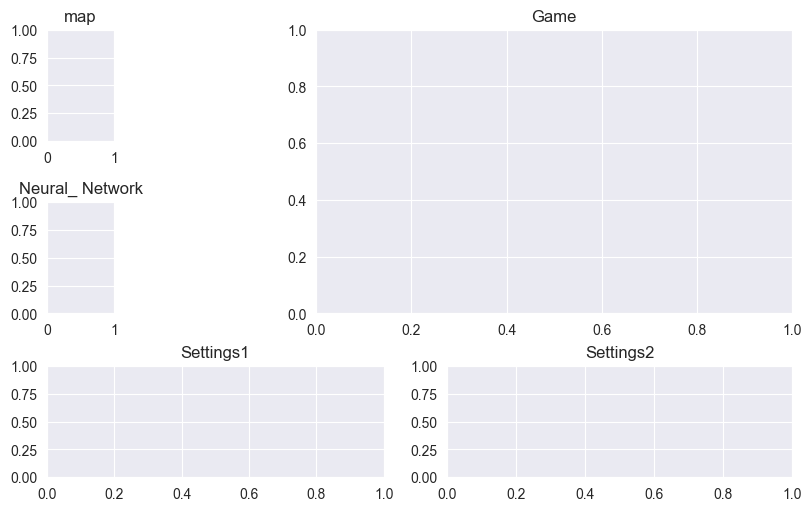

In [6]:
env = Environment(nb_cars=50, n_points=200)
env.

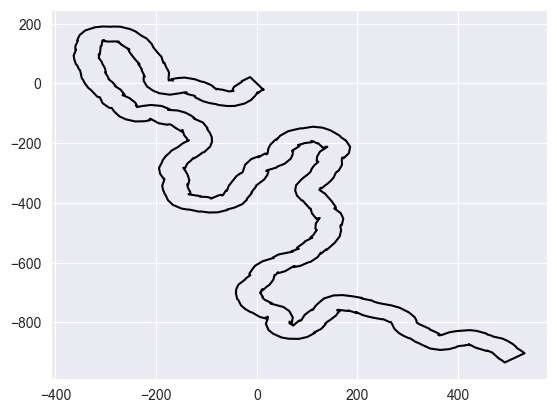

In [8]:
plt.plot(*env.route.polygon.exterior.xy, color='black')

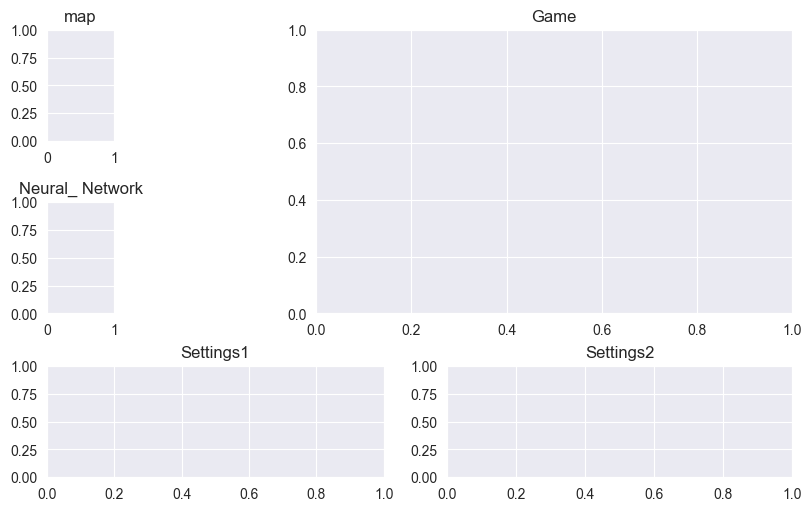

In [7]:
env = Environment(nb_cars=50, n_points=300, width=50)

In [5]:
for i in range(10):
    try:
        env = Environment(nb_cars=100, route_length=100, route_width=20)
        fig, ax = plt.subplots(1,1,figsize=(10,10))
        ax.plot(*env.route.polygon.exterior.xy, color='black')
        plt.axis("equal")
        plt.show()

        break
    except:
        if i == 9:
            print("Impossible to generate a route with these parameters. Please change them.")
            exit()
        else:
            continue

Impossible to generate a route with these parameters. Please change them.


In [3]:

env = Environment(nb_cars=100, route_length=100, route_width=20)

NameError: name 'Environment' is not defined

In [4]:
from driving.environment import Environment

In [14]:
df

,Generation,T,car,x,y,alive
0,0,0,0,4.361717,-8.929947,True
1,0,0,1,5.003622,-8.655769,True
2,0,0,2,5.022737,-8.575861,True
3,0,0,3,9.515784,-3.072986,True
4,0,0,4,8.025304,-5.944652,True
...,...,...,...,...,...,...
60145,1,400,95,70.599533,125.809685,False
60146,1,400,96,24.595472,-39.023155,False
60147,1,400,97,41.642548,-41.047913,False
60148,1,400,98,69.718140,126.714882,False


In [32]:


import plotly.express as px

def plot_animated_race(env, df, g):

    fig = px.line(
        x=env.route.polygon.exterior.xy[0],
        y=env.route.polygon.exterior.xy[1]
    )

    fig =px.scatter(df[df["Generation"]==g],
                     x="x",
                     y="y",
                     color="car",
                     hover_name="car",
                    animation_frame="T",
                     )

    fig.add_trace(
        px.line(
        x=env.route.polygon.exterior.xy[0],
        y=env.route.polygon.exterior.xy[1]
    ).data[0]
    )

    fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 30
    fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 5

    # Add route to the plo
    fig.show()


In [34]:
plot_animated_race(env, df, 0)

In [22]:
fig = px.line(
    x=env.route.polygon.exterior.xy[0],
    y=env.route.polygon.exterior.xy[1]
)
# Put equal axis
fig.update_layout(
    xaxis=dict(
        scaleanchor="y",
        scaleratio=1,
    ),
    yaxis=dict(
        scaleanchor="x",
        scaleratio=1,
    )
)
# add animation
fig.add_trace(px.scatter(df_animation,
                         x="x",
                         y="y",
                         color="alive",
                         hover_name="car",
                         animation_frame="T").data[0])

fig.show()

In [24]:
px.scatter(df[df["Generation"]==0],
                 x="x",
                 y="y",
                 color="alive",
                 hover_name="car",
                animation_frame="T",
                    )

# Add route to the plo
fig.show()



In [18]:
# save route to pkl
import pickle
with open("../data/streamlit_cache/route.pkl", "wb") as f:
    pickle.dump(env.route, f)

# Load route from pkl
with open("../data/streamlit_cache/route.pkl", "rb") as f:
    route = pickle.load(f)

In [22]:
#show route
import plotly.express as px
fig = px.line(
    x=route.polygon.exterior.xy[0],
    y=route.polygon.exterior.xy[1]
)
fig.show()

(array('d', [2.9632786606309223, 14.433661104013861, 24.424955090137445, 32.515792059867216, 42.03384627671985, 49.426384998598124, 51.03383519312911, 56.217911228863045, 56.255266156566606, 52.38646312734002, 48.438132938321374, 45.10369263161316, 40.558143298055086, 32.76710589406744, 27.429749873751557, 23.773268440642987, 22.665837291327385, 23.745537119258422, 27.556394423523372, 33.658164267865885, 37.853581088049765, 44.14033199845608, 55.92185396047792, 66.33812699200568, 69.44144153580172, 78.34411597792959, 80.94394878476488, 86.21454437774648, 98.84784711968416, 106.67088505411672, 111.93901943537554, 121.44534001910043, 132.21722389833977, 138.9335207748332, 142.11450122441, 145.13672082216266, 150.23385861582628, 156.32198099279768, 162.68718049020842, 168.77133132829624, 178.90029251141846, 185.57797569347898, 194.31604514225452, 202.11193793322187, 211.07513703331517, 221.73945745937164, 236.11225229983634, 243.15396406505155, 256.8598846914784, 263.2092012481276, 273.22

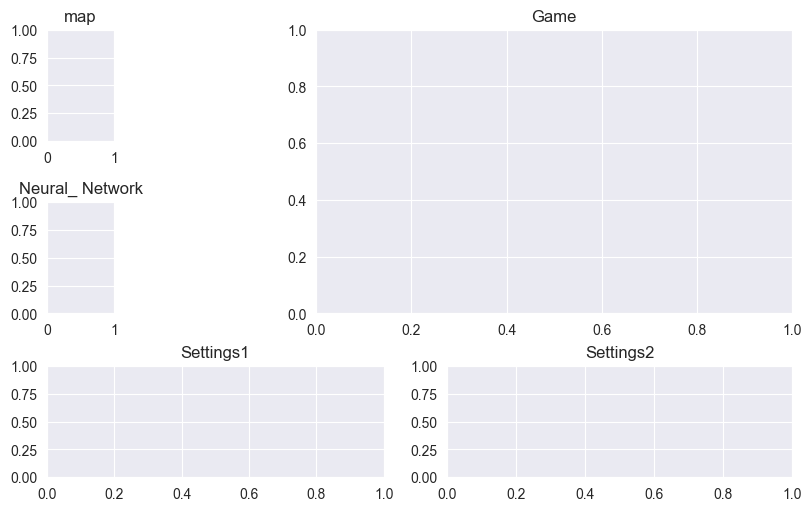

In [25]:
E

In [1]:
env = Environment(nb_cars=1)
for car in env.cars:
    car.pos = (0,0)
    car.move_car(np.random.rand() * 2 - 1)
    car.theta = env.route.initial_theta

env.plot_UI()
env.UI

NameError: name 'Environment' is not defined

TopologyException: Input geom 0 is invalid: Self-intersection at or near point -228.39285580912258 58.16335908444244 at -228.39285580912258 58.16335908444244
TopologyException: Input geom 0 is invalid: Self-intersection at or near point -228.39285580912258 58.16335908444244 at -228.39285580912258 58.16335908444244
TopologyException: Input geom 0 is invalid: Self-intersection at or near point -228.39285580912258 58.16335908444244 at -228.39285580912258 58.16335908444244
TopologyException: Input geom 0 is invalid: Self-intersection at or near point -228.39285580912258 58.16335908444244 at -228.39285580912258 58.16335908444244
TopologyException: Input geom 0 is invalid: Self-intersection at or near point -228.39285580912258 58.16335908444244 at -228.39285580912258 58.16335908444244
TopologyException: Input geom 0 is invalid: Self-intersection at or near point -228.39285580912258 58.16335908444244 at -228.39285580912258 58.16335908444244
TopologyException: Input geom 0 is invalid: Self-int

error !
error !
error !
error !
error !
error !
error !
error !
error !
error !


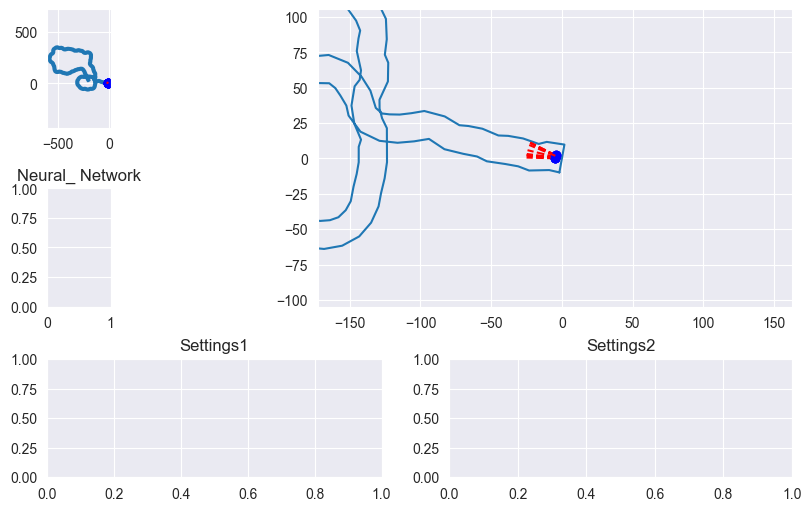

<Figure size 640x480 with 0 Axes>